
<br>
<font>
<div dir=ltr align=center>
<font color=0F5298 size=7>
    Machine Learning <br> <br>
<font color=2565AE size=5>
    CE Department <br>
    Fall 2024 - Prof. Sharifi Zarchi<br>
<font color=3C99D size=5>
    HW4 Practical <br>
    Image Colorization<br>
    Image Segmentation<br>
<font color=696880 size=4>
    Shayan Shabani


In [1]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


This assignment is structured to introduce students to practical applications of generative models in computer vision.
It targets two challenging areas: colorization and segmentation, using architectures that are complex but very applicable in industry settings.
## Machine Learning Assignment #4: Practical Applications in Image Processing

## Learning Objectives:
By the end of this assignment, students will be able to:
1. Understand and implement Variational Autoencoders for image colorization.
2. Apply the U-Net architecture for image segmentation.
3. Preprocess image datasets, including augmentation techniques.
4. Analyze the performance of machine learning models using relevant metrics.
5. Explore the relationship between latent space and output quality in generative models.


# Image Colorization using VAE
In this section of the assignment, students will explore the fascinating field of image colorization using Variational Autoencoders (VAEs), a type of generative model in deep learning. The task involves transforming grayscale images into colored ones, leveraging the encoder-decoder architecture of VAEs, which are adept at learning complex data distributions. Students will implement and fine-tune an autoencoder network, utilizing components like perceptual loss and feature extraction from pre-trained models, to improve colorization output. By doing so, they will gain a deeper understanding of generative models and their practical applications in computer vision tasks. This exercise offers a hands-on opportunity to blend theoretical knowledge with practical coding skills, characterizing the creative potential of AI in image processing.

Dataset: https://drive.google.com/drive/folders/1KeJbfUykGnPlz0q08_b1IjtW8OxkPdQ9?usp=sharing

## Importing Libraries

In [2]:
!pip install pytorch_lightning
!pip install seaborn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 819.3/819.3 kB 19.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 926.4/926.4 kB 52.5 MB/s eta 0:00:00


In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sea
from tqdm.notebook import tqdm
import os
import torch
import torch.nn as nn
import pytorch_lightning as pl
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torch.nn.functional as F
import torchmetrics
from torchmetrics import Metric
import torchvision
import math
from sklearn.utils import shuffle
from PIL import Image
print(plt.style.available)
plt.style.use('seaborn-v0_8')
device = 'cuda' if torch.cuda.is_available() else 'cpu'

np.__version__, device

['Solarize_Light2', '_classic_test_patch', '_mpl-gallery', '_mpl-gallery-nogrid', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn-v0_8', 'seaborn-v0_8-bright', 'seaborn-v0_8-colorblind', 'seaborn-v0_8-dark', 'seaborn-v0_8-dark-palette', 'seaborn-v0_8-darkgrid', 'seaborn-v0_8-deep', 'seaborn-v0_8-muted', 'seaborn-v0_8-notebook', 'seaborn-v0_8-paper', 'seaborn-v0_8-pastel', 'seaborn-v0_8-poster', 'seaborn-v0_8-talk', 'seaborn-v0_8-ticks', 'seaborn-v0_8-white', 'seaborn-v0_8-whitegrid', 'tableau-colorblind10']


('1.26.4', 'cuda')

## Loading the Data

In [4]:
import os
import pandas as pd
from tqdm import tqdm

def load_data(PATH):
    # TODO: Initialize lists to store filenames and their corresponding outcomes
    filenames = []
    outcomes = []
    # TODO: Create a DataFrame from the filenames and outcomes
    for root, dirs, files in os.walk(PATH):
        for filename in files:
            if filename.endswith('.jpg') or filename.endswith('.png'):
                full_path = os.path.join(root, filename)
                folder_name = os.path.basename(root)
                filenames.append(full_path)
                outcomes.append(folder_name)
    print(outcomes)
    data = pd.DataFrame({
        'filename': filenames,
        'outcome': outcomes
    })
    # TODO: Return the shuffled DataFrame
    data = shuffle(data).reset_index(drop=True)
    return data

# TODO: Load the training, validation, and test data using the load_data function
train_data = load_data('/content/drive/MyDrive/archive/train')
val_data = load_data('/content/drive/MyDrive/archive/valid')
test_data = load_data('/content/drive/MyDrive/archive/test')
# TODO: Check the shape of the loaded DataFrames to verify correct data loading
print(train_data.shape, val_data.shape, test_data.shape)

['AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COOT', 'AMERICAN COO

In [5]:
# TODO: Combine the training and test data into a single DataFrame along the vertical axis
full_data = pd.concat([train_data, test_data], axis=0)
print(full_data.shape)

(3308, 2)


In [6]:
full_data.head()

,filename,outcome
0,/content/drive/MyDrive/archive/train/AFRICAN O...,AFRICAN OYSTER CATCHER
1,/content/drive/MyDrive/archive/train/AFRICAN P...,AFRICAN PYGMY GOOSE
2,/content/drive/MyDrive/archive/train/AMERICAN ...,AMERICAN COOT
3,/content/drive/MyDrive/archive/train/ALTAMIRA ...,ALTAMIRA YELLOWTHROAT
4,/content/drive/MyDrive/archive/train/ALBATROSS...,ALBATROSS


## Plot some of the images

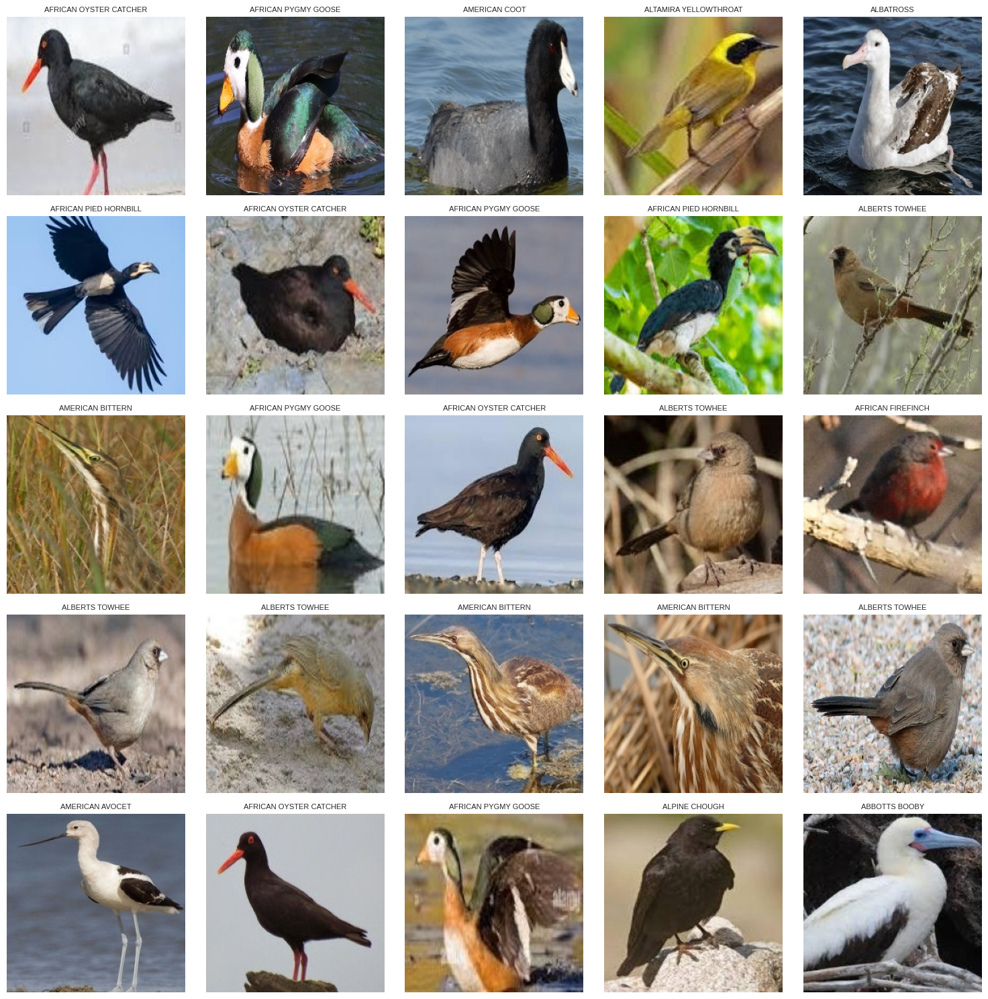

In [7]:
# TODO: Plot some of images
def plot_images(data, num_rows=5, num_cols=5):
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15))
    for i, ax in enumerate(axes.flatten()):
        if i < len(data):
            img = Image.open(data.iloc[i]['filename'])
            ax.imshow(img)
            ax.set_title(data.iloc[i]['outcome'], fontsize=8)
            ax.axis('off')
        else:
            ax.axis('off')
    plt.tight_layout()
    plt.show()

plot_images(full_data)

## Dataset Distribution
plot the distribution of the dataset, both training and validation set

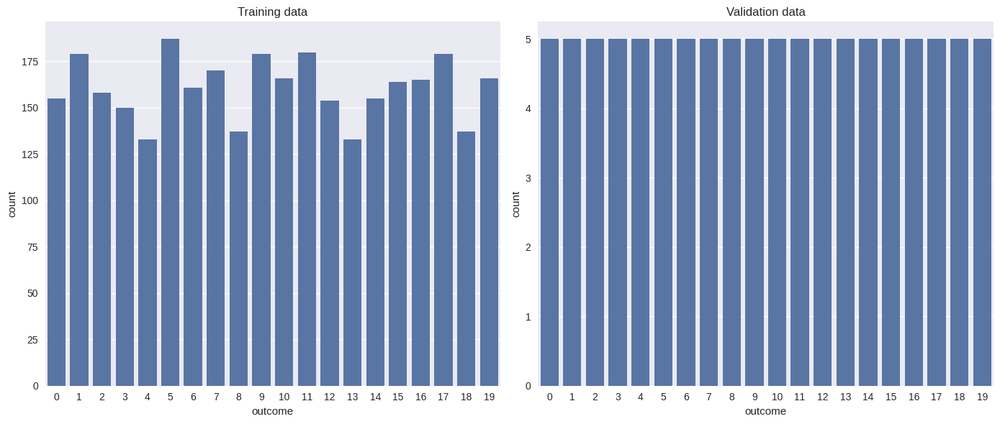

In [8]:
# TODO: Plot the distribution of classes
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
sea.countplot(data=train_data, x='outcome')
plt.title("Training data")
plt.xlabel("outcome")
plt.ylabel("count")
plt.xticks(ticks=range(20), labels=range(20))
plt.subplot(1, 2, 2)
sea.countplot(data=val_data, x='outcome')
plt.title("Validation data")
plt.xlabel("outcome")
plt.ylabel("count")
plt.xticks(ticks=range(20), labels=range(20))
plt.tight_layout()
plt.show()

label_mapping = {label: idx for idx, label in enumerate(full_data['outcome'].unique())}

## Dataset Preparation
Now we are going to build the dataset by using `Dataset` and `DataLoader` classes within PyTorch. I recommend you to randomly crop the images to (160, 160) and then normalize them.

In [9]:
import cv2

class BirdDataset(Dataset):
    def __init__(self, df, transform1=None, transform2=None):
        self.df = df
        self.transform1 = transform1
        self.transform2 = transform2

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        img = plt.imread(self.df.iloc[idx]['filename'])
        g_img = Image.fromarray(cv2.cvtColor(img, cv2.COLOR_RGB2GRAY))
        rgb_img = Image.fromarray(img)
        if self.transform1:
            g_image = self.transform1(g_img)
        if self.transform2:
            rgb_image = self.transform2(rgb_img)
        return g_image, rgb_image


t1 = transforms.Compose([
    transforms.Resize((160, 160)),
    transforms.ToTensor()
])

t2 = transforms.Compose([
    transforms.Resize((160, 160)),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.ToTensor()
])

train_dataset = BirdDataset(train_data, t1, t2)
val_dataset = BirdDataset(val_data, t1, t2)
test_dataset = BirdDataset(test_data,  t1, t2)

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

**Why is data augmentation pivotal in training models for image tasks, and what techniques are beneficial for this particular assignment?**

## Model Architecture
The model has an encoder block for encoding the grayscale image into a lower representation followed by a decoder block to generate the colorized image.

In [21]:
import torchvision.models as models
import torch.nn as nn
import torch
import torch.optim as optim
from tqdm import tqdm
import math
from torchvision import transforms

# The following classes define the various components of our VAE model.
# Each class includes a simple explanation of its role in the overall architecture.

# The VAE consists of an encoder to compress the input into a smaller latent representation,
# and a decoder to reconstruct the colorized output from the latent space.


# Hint for students: Initialize the perceptual loss with different feature layers based on the network architecture.
# - You have to use VGG pretrained model for this part
class PerceptualLoss(nn.Module):
    def __init__(self, feature_layers=None, use_half=False):
        super(PerceptualLoss, self).__init__()
        self.layers = nn.ModuleList()
        self.use_half = use_half
        if feature_layers is None:
            feature_layers = [0, 5, 10, 19, 28]
        vgg = models.vgg19(pretrained=True).features
        self.feature_layers = feature_layers
        for param in self.parameters():
            param.requires_grad = False
        for i in range(max(feature_layers) + 1):
            self.layers.append(vgg[i])

    def forward(self, x, y):
        if self.use_half:
            x, y = x.half(), y.half()
        x = (x - torch.tensor([0.485, 0.456, 0.406]).view(1, 3, 1, 1).to(x.device)) / torch.tensor([0.229, 0.224, 0.225]).view(1, 3, 1, 1).to(x.device)
        y = (y - torch.tensor([0.485, 0.456, 0.406]).view(1, 3, 1, 1).to(x.device)) / torch.tensor([0.229, 0.224, 0.225]).view(1, 3, 1, 1).to(x.device)
        loss = 0
        for i, layer in enumerate(self.layers):
            x, y = layer(x), layer(y)
            if i in self.feature_layers:
                loss += F.l1_loss(x, y)
        return loss

# Hint: Define the structure of the encoder by using convolutional layers with optional batch normalization.
class Encoder(nn.Module):
    def __init__(self, do_bn=False):
        super(Encoder, self).__init__()
        self.do_bn = do_bn
        self.block1 = self.inner_block(1, 64)
        self.block2 = self.inner_block(64, 128)
        self.block3 = self.inner_block(128, 256)
        self.block4 = self.inner_block(256, 512)
        self.fc_mu = nn.Linear(512*10*10, 128)
        self.fc_logvar = nn.Linear(512*10*10, 128)

    def inner_block(self, in_c, out_c):
        layers = []
        layers.append(nn.Conv2d(in_c, out_c, kernel_size=3, stride=1, padding=1))
        if self.do_bn:
            layers.append(nn.BatchNorm2d(out_c))
        layers.append(nn.ReLU(inplace=True))
        layers.append(nn.MaxPool2d(kernel_size=2, stride=2))
        return nn.Sequential(*layers)

    def forward(self, x):
        x = self.block1(x)
        x = self.block2(x)
        x = self.block3(x)
        x = self.block4(x)
        logvar = self.fc_logvar(x.view(x.size(0), -1))
        mu = self.fc_mu(x.view(x.size(0), -1))
        return mu, logvar


# Hint: Define the decoder's symmetric structure to the encoder for upsampling and reconstructing the input.
class Decoder(nn.Module):
    def __init__(self, do_bn=False):
        super(Decoder, self).__init__()
        self.do_bn = do_bn
        self.block1 = self.inner_block(512, 256)
        self.block2 = self.inner_block(256, 128)
        self.block3 = self.inner_block(128, 64)
        self.block4 = self.inner_block(64, 32)
        self.fc = nn.Linear(128, 512*10*10)
        self.final_conv = nn.Conv2d(32, 3, kernel_size=3, stride=1, padding=1)


    def inner_block(self, in_c, out_c, out=False):
        layers = []
        layers.append(nn.ConvTranspose2d(in_c, out_c, kernel_size=2, stride=2))
        if self.do_bn:
            layers.append(nn.BatchNorm2d(out_c))
        layers.append(nn.ReLU(inplace=True))
        return nn.Sequential(*layers)

    def forward(self, h):
        h = self.fc(h)
        h = h.view(h.size(0), 512, 10, 10)
        h = self.block1(h)
        h = self.block2(h)
        h = self.block3(h)
        h = self.block4(h)
        return torch.sigmoid(self.final_conv(h))


# Hint: Integrate the encoder, decoder, and loss components into the overall network class.
class Net(nn.Module):
    def __init__(self, lr=1e-4, do_bn=False, use_perceptual_loss=False):
        super(Net, self).__init__()
        self.encoder = Encoder(do_bn=do_bn)
        self.decoder = Decoder(do_bn=do_bn)
        self.optim = optim.Adam(self.parameters(), lr=lr)
        self.use_perceptual_loss = use_perceptual_loss
        if use_perceptual_loss:
            self.perceptual_loss = PerceptualLoss(feature_layers=[0, 5, 10, 19, 28])

    def forward(self, x):
        mu, logvar = self.encoder(x)
        std = torch.exp(0.5*logvar)
        recon = self.decoder(mu + torch.randn_like(std)*std)
        return recon, mu, logvar

    def compute_loss(self, pred, target, mu, logvar):
        recon_loss = F.mse_loss(pred, target)
        if self.use_perceptual_loss:
            recon_loss += 0.01 * self.perceptual_loss(pred, target)
        kld_loss = -0.5 * torch.mean(1 + logvar - mu.pow(2) - logvar.exp())
        return recon_loss + 0.001 * kld_loss, recon_loss, kld_loss

    def training_step(self, X):
        images, labels = X
        device = next(self.parameters()).device
        images = images.to(device)
        target = labels.to(device)
        pred, mu, logvar = self.forward(images)
        loss, recon_loss, kld_loss = self.compute_loss(pred, target, mu, logvar)
        self.optim.zero_grad()
        loss.backward()
        self.optim.step()
        return loss.item(), recon_loss.item(), kld_loss.item()

    def validation_step(self, X):
        with torch.no_grad():
            images, labels = X
            device = next(self.parameters()).device
            images = images.to(device)
            labels = labels.to(device)
            pred, mu, logvar = self.forward(images)
            loss, recon_loss, kld_loss = self.compute_loss(pred, labels, mu, logvar)
        return loss.item(), recon_loss.item(), kld_loss.item()

    def train_model(self, train_loader, val_loader=None, epochs=10):
        self.to('cuda')
        train_loss = []
        val_loss = []
        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(self.optim, mode='min', factor=0.1, patience=5, verbose=True)
        for epoch in range(epochs):
            self.train()
            train_losses = []
            for batch in tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs} [Train]"):
                train_losses.append(self.training_step(batch))
            self.eval()
            val_losses = []
            for batch in tqdm(val_loader, desc=f"Epoch {epoch+1}/{epochs} [Val]"):
                val_losses.append(self.validation_step(batch))
            train_loss_avg = torch.tensor([x[0] for x in train_losses]).mean().item()
            val_loss_avg = torch.tensor([x[0] for x in val_losses]).mean().item()
            scheduler.step(val_loss_avg)
            print(f"Epoch {epoch+1}/{epochs}: Train Loss: {train_loss_avg:.4f}, Val Loss: {val_loss_avg:.4f}")
            train_loss += [train_loss_avg]
            val_loss += [val_loss_avg]
        return train_loss, val_loss

In [22]:
#print the model
model = Net()
print(model)

Net(
  (encoder): Encoder(
    (block1): Sequential(
      (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
    (block2): Sequential(
      (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
    (block3): Sequential(
      (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
    (block4): Sequential(
      (0): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
    (fc_mu): Linear(in_features=51200, out_features=512, bias=True)
 

## Training Phase

In [24]:
# TODO: Train
# Students should implement the training loop. During training, monitor both training and validation metrics
# to ensure the model learns effectively without overfitting.
train_loss,val_loss = model.train_model(train_loader,val_loader, epochs=30)

Epoch 1/30 [Val]: 100%|██████████| 7/7 [00:01<00:00,  6.44it/s]


Epoch 1/30: Train Loss: 0.0480, Val Loss: 0.0361


Epoch 2/30 [Val]: 100%|██████████| 7/7 [00:01<00:00,  6.29it/s]


Epoch 2/30: Train Loss: 0.0336, Val Loss: 0.0369


Epoch 3/30 [Val]: 100%|██████████| 7/7 [00:01<00:00,  5.41it/s]


Epoch 3/30: Train Loss: 0.0311, Val Loss: 0.0299


Epoch 4/30 [Val]: 100%|██████████| 7/7 [00:01<00:00,  6.81it/s]


Epoch 4/30: Train Loss: 0.0292, Val Loss: 0.0293


Epoch 5/30 [Val]: 100%|██████████| 7/7 [00:01<00:00,  5.24it/s]


Epoch 5/30: Train Loss: 0.0280, Val Loss: 0.0271


Epoch 6/30 [Val]: 100%|██████████| 7/7 [00:01<00:00,  6.88it/s]


Epoch 6/30: Train Loss: 0.0271, Val Loss: 0.0279


Epoch 7/30 [Val]: 100%|██████████| 7/7 [00:01<00:00,  6.72it/s]


Epoch 7/30: Train Loss: 0.0257, Val Loss: 0.0286


Epoch 8/30 [Val]: 100%|██████████| 7/7 [00:01<00:00,  6.19it/s]


Epoch 8/30: Train Loss: 0.0255, Val Loss: 0.0265


Epoch 9/30 [Val]: 100%|██████████| 7/7 [00:01<00:00,  6.45it/s]


Epoch 9/30: Train Loss: 0.0247, Val Loss: 0.0267


Epoch 10/30 [Val]: 100%|██████████| 7/7 [00:01<00:00,  5.03it/s]


Epoch 10/30: Train Loss: 0.0243, Val Loss: 0.0284


Epoch 11/30 [Val]: 100%|██████████| 7/7 [00:01<00:00,  6.48it/s]


Epoch 11/30: Train Loss: 0.0234, Val Loss: 0.0266


Epoch 12/30 [Val]: 100%|██████████| 7/7 [00:01<00:00,  6.70it/s]


Epoch 12/30: Train Loss: 0.0230, Val Loss: 0.0280


Epoch 13/30 [Val]: 100%|██████████| 7/7 [00:01<00:00,  6.79it/s]


Epoch 13/30: Train Loss: 0.0227, Val Loss: 0.0262


Epoch 14/30 [Val]: 100%|██████████| 7/7 [00:01<00:00,  6.42it/s]


Epoch 14/30: Train Loss: 0.0220, Val Loss: 0.0249


Epoch 15/30 [Val]: 100%|██████████| 7/7 [00:01<00:00,  5.01it/s]


Epoch 15/30: Train Loss: 0.0214, Val Loss: 0.0262


Epoch 16/30 [Val]: 100%|██████████| 7/7 [00:01<00:00,  6.24it/s]


Epoch 16/30: Train Loss: 0.0213, Val Loss: 0.0268


Epoch 17/30 [Val]: 100%|██████████| 7/7 [00:01<00:00,  6.39it/s]


Epoch 17/30: Train Loss: 0.0207, Val Loss: 0.0249


Epoch 18/30 [Val]: 100%|██████████| 7/7 [00:01<00:00,  5.50it/s]


Epoch 18/30: Train Loss: 0.0201, Val Loss: 0.0268


Epoch 19/30 [Val]: 100%|██████████| 7/7 [00:01<00:00,  6.34it/s]


Epoch 19/30: Train Loss: 0.0199, Val Loss: 0.0257


Epoch 20/30 [Val]: 100%|██████████| 7/7 [00:01<00:00,  5.34it/s]


Epoch 20/30: Train Loss: 0.0196, Val Loss: 0.0282


Epoch 21/30 [Val]: 100%|██████████| 7/7 [00:01<00:00,  6.86it/s]


Epoch 21/30: Train Loss: 0.0178, Val Loss: 0.0262


Epoch 22/30 [Val]: 100%|██████████| 7/7 [00:01<00:00,  6.39it/s]


Epoch 22/30: Train Loss: 0.0177, Val Loss: 0.0283


Epoch 23/30 [Val]: 100%|██████████| 7/7 [00:01<00:00,  6.85it/s]


Epoch 23/30: Train Loss: 0.0174, Val Loss: 0.0258


Epoch 24/30 [Val]: 100%|██████████| 7/7 [00:01<00:00,  5.92it/s]


Epoch 24/30: Train Loss: 0.0172, Val Loss: 0.0248


Epoch 25/30 [Val]: 100%|██████████| 7/7 [00:01<00:00,  6.50it/s]


Epoch 25/30: Train Loss: 0.0171, Val Loss: 0.0250


Epoch 26/30 [Val]: 100%|██████████| 7/7 [00:01<00:00,  6.58it/s]


Epoch 26/30: Train Loss: 0.0171, Val Loss: 0.0256


Epoch 27/30 [Val]: 100%|██████████| 7/7 [00:01<00:00,  5.65it/s]


Epoch 27/30: Train Loss: 0.0169, Val Loss: 0.0249


Epoch 28/30 [Val]: 100%|██████████| 7/7 [00:01<00:00,  6.52it/s]


Epoch 28/30: Train Loss: 0.0167, Val Loss: 0.0243


Epoch 29/30 [Val]: 100%|██████████| 7/7 [00:01<00:00,  6.60it/s]


Epoch 29/30: Train Loss: 0.0167, Val Loss: 0.0245


Epoch 30/30 [Val]: 100%|██████████| 7/7 [00:01<00:00,  5.35it/s]

Epoch 30/30: Train Loss: 0.0167, Val Loss: 0.0245


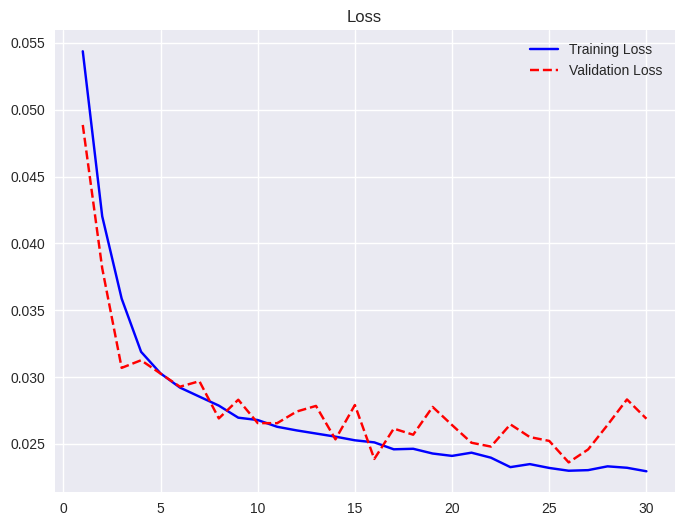

In [15]:
# TODO: Plot training and validation loss over epochs
plt.figure(figsize=(8, 6))
plt.plot(range(1, 30+1), train_loss, label="Training Loss", color='blue')
plt.plot(range(1, 30+1), val_loss, label="Validation Loss", color='red', linestyle='--')
plt.title("Loss")
plt.legend()
plt.grid(True)
plt.show()

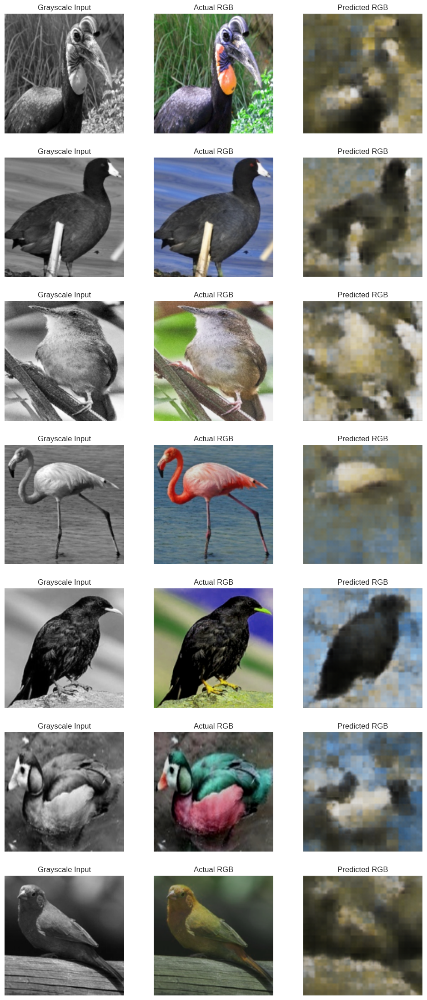

In [25]:
# TODO: Plot grayscale, actual, and predicted inputs
def visualize_samples(dataset, num_samples=7):
    fig, axes = plt.subplots(num_samples, 3, figsize=(12, 4 * num_samples))
    for i in range(num_samples):
        g_image, rgb_image = dataset[i]
        gray_image_np = g_image.squeeze(0).numpy()
        rgb_image_np = rgb_image.permute(1, 2, 0).numpy()
        plt.imshow(gray_image_np, cmap='gray')
        plt.set_title('Grayscale Input')
        plt.axis('off')
        plt.imshow(rgb_image_np)
        plt.set_title('Actual')
        plt.axis('off')
        g_image = g_image.unsqueeze(0).to(device)
        pred, _, _ = model(g_image)
        pred = pred[0].permute(1, 2, 0).cpu().detach().numpy()
        plt.imshow(pred)
        plt.set_title('Predicted')
        plt.axis('off')
    plt.tight_layout()
    plt.show()

visualize_samples(test_dataset)

<ipython-input-30-1b4321b5880c>:94: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = plt.scatter(latent_2d[:, 0], latent_2d[:, 1], cmap='viridis', alpha=0.6)


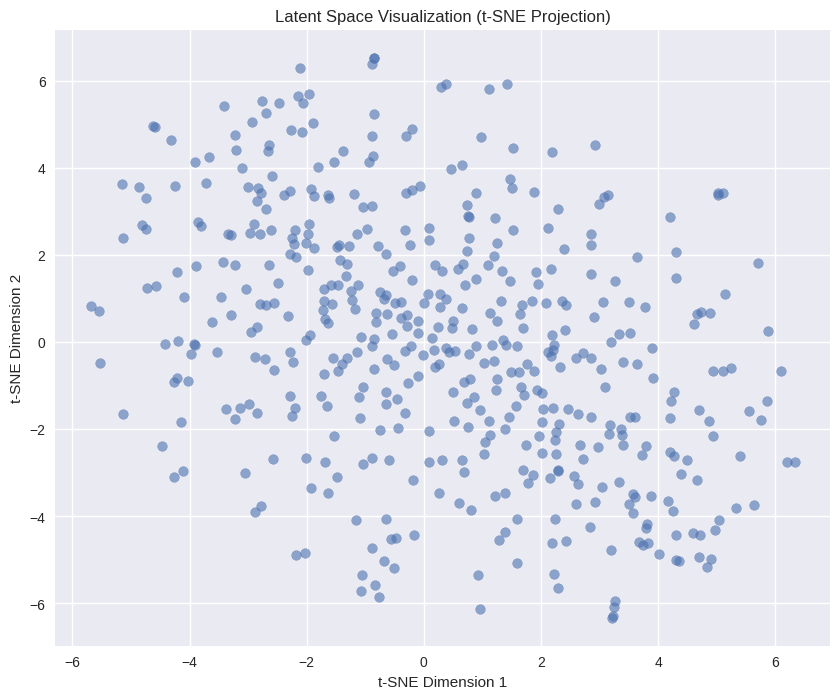

In [30]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import torch

# Function to visualize the latent space
def visualize_latent_space(encoder, data_loader, num_samples=1000):
    """
    Uses a 2-dimensional t-SNE plot to visualize latent space of encoded images.

    Parameters:
    encoder (torch.nn.Module): The encoder model component of the VAE.
    data_loader (torch.utils.data.DataLoader)
    num_samples (int): Number of samples to visualize
    """
    # - Set model to evaluation mode
    encoder.eval()
    # - Limit the number of samples based on the user's preference
    latent_vectors = []
    total_samples = 0
    for gray_images, _ in data_loader:
        if total_samples >= num_samples:
            break
        # - Move images to the same device as the model
        gray_images = gray_images.to(device)
        # - Use the encoder to get the mean (mu) of the latent distribution
        with torch.no_grad():
            latent_repr = encoder(gray_images)  # Encoder output
            latent_repr = latent_repr.view(latent_repr.size(0), -1)  # Flatten to 2D
        latent_vectors.append(latent_repr.cpu())
        total_samples += gray_images.size(0)
    # - Stack all obtained latent vectors
    latent_vectors = torch.cat(latent_vectors)[:num_samples]
    # - t-SNE reduction to 2D for visualization
    tsne = TSNE(n_components=2, random_state=42)
    latent_2d = tsne.fit_transform(latent_vectors.numpy())
    # - Plotting the 2D projection
    plt.figure(figsize=(8, 6))
    plt.scatter(latent_2d[:, 0], latent_2d[:, 1], c='blue', alpha=0.6, label="Latent Points")
    plt.title("Latent Space Visualization (t-SNE Projection)")
    plt.xlabel("t-SNE Dimension 1")
    plt.ylabel("t-SNE Dimension 2")
    plt.legend()
    plt.grid(True)
    plt.show()


# Use visualize_latent_space function post-training to observe the latent space
visualize_latent_space(model.encoder, test_loader, num_samples=1000)

How the distribution of points in the latent space reflects the VAE's capability to generalize grayscale images into colored outputs.

A well-structured latent space indicates the VAE can generalize grayscale images into plausible colored outputs, with similar grayscale inputs forming clusters.

1. **Clustering and Class Representation**:
    - Can you identify clusters in the latent space that correspond to specific image features or categories?

    Clusters correspond to image features or categories like texture or shape.

    - How do these clusters inform us about the VAE's ability to differentiate between various input characteristics related to color information?

    Clear clusters suggest the VAE effectively encodes distinct input features, aiding diverse and accurate color outputs.

2. **Continuity and Transitions**:
    - Analyze whether neighboring points in the latent space result in similar or different color outputs. What does this continuity suggest about the latent representation's smoothness?

    Similar color outputs indicate smooth latent representation; abrupt differences suggest poor regularization.

    - How could these visual transitions impact the quality and realism of the generated colorations, especially for input images that exhibit gradual changes (e.g., transitions in lighting or shading)?

    Smooth transitions enhance quality, especially for inputs requiring gradual changes like lighting variations.

3. **Effectiveness of Dimensionality Reduction**:
    - Assess the effectiveness of t-SNE in projecting high-dimensional latent vectors into a comprehensible 2D representation. What limitations might exist, and how do they affect your interpretation?

    Preserves local relationships, aiding cluster visualization in latent space.
    Distorts global structure, sensitive to parameters, and may lose nuanced high-dimensional information.


Elaborate on how the encoder-decoder architecture facilitates the learning of complex data distributions in image colorization. How does this architecture differ from a simple autoencoder?

The encoder-decoder learns complex data distributions by encoding the grayscale image into a latent space and decoding it into a colorized image. Unlike a simple autoencoder, which reconstructs the input, the encoder-decoder architecture generates a different output from the input.

Analyze the role of perceptual loss in enhancing the quality of colorized images. How does perceptual loss measure image similarity compared to pixel-wise losses like Mean Squared Error (MSE)?

Perceptual loss focuses on high-level feature similarity (e.g., using VGG) rather than pixel-wise accuracy like MSE. It improves visual quality by preserving structure and texture, leading to more natural colorization.

Discuss how the latent space in a VAE impacts the fidelity and diversity of generated color images. What effects could varying the dimensionality of the latent space have?

The latent space in a VAE captures complex distributions and enables smooth interpolation. Varying its dimensionality affects fidelity (higher dimensions give more detail) and diversity (lower dimensions encourage more generalization).

# Image Segmentation with U-Net
Image segmentation is a crucial task in computer vision aimed at dividing an image into meaningful segments or objects. The U-Net architecture, famed for its utility in medical imaging, excels at this by leveraging its encoder-decoder structure, which efficiently learns and reconstructs image details. In this task, the U-Net is trained on pairs of images and masks, enabling it to delineate object boundaries at the pixel level with high precision. The training process involves preprocessing the data, adjusting network parameters, and evaluating the model using metrics like Intersection over Union (IoU) to ensure effective segmentation. Successful implementation of U-Net for this purpose can revolutionize applications in areas like autonomous vehicles, medical diagnosis, and agricultural monitoring.

Dataset: https://drive.google.com/drive/folders/1g97fGNQ6buixT8Hp96QyEYOMNKby5Oe8?usp=sharing

## Importing necessary libraries

In [31]:
# import system libs
import os
import time
import glob
import shutil

# import data handling tools
import cv2
from PIL import Image
import numpy as np
import pandas as pd
import seaborn as sns
sns.set_style('darkgrid')
import matplotlib.pyplot as plt
# import necessary PyTorch libraries
import torch.nn as nn
print ('modules loaded')

modules loaded


## Load the Dataset

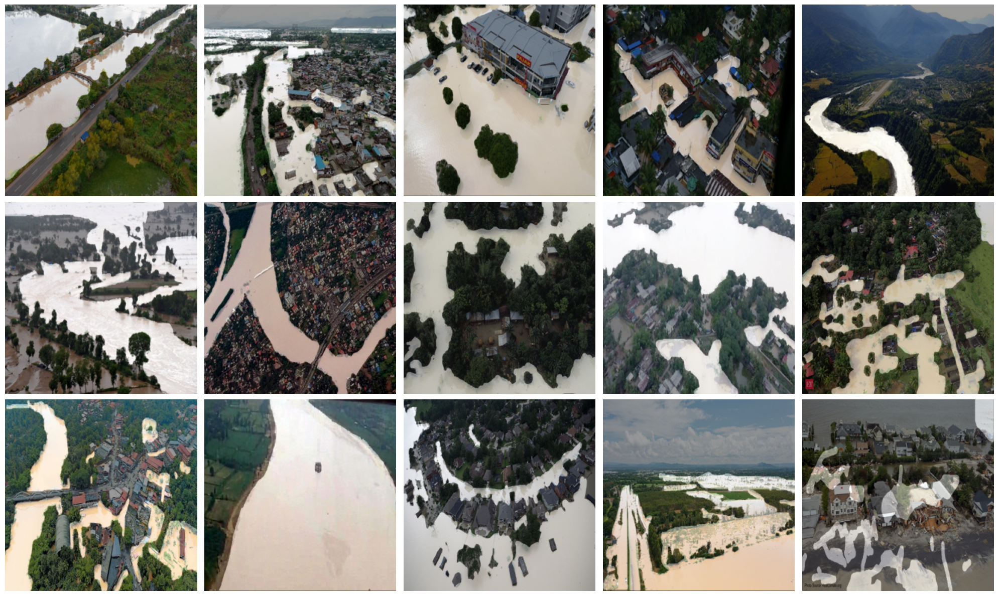

In [32]:
def create_data(data_dir):
    """
    TODO: Traverse through the given data directory to extract and return paths to images and masks.
    - Identify relevant folders for images and masks.
    - Collect file paths from these folders and return them as lists.
    """
    images_path = os.path.join(data_dir, 'Image')
    masks_path = os.path.join(data_dir, 'Mask')
    image_files = sorted([os.path.join(images_path, file) for file in os.listdir(images_path) if file.endswith(('png', 'jpg', 'jpeg'))])
    mask_files = sorted([os.path.join(masks_path, file) for file in os.listdir(masks_path) if file.endswith(('png', 'jpg', 'jpeg'))])
    return image_files, mask_files


def load_image(image, SIZE):
    """
    TODO: Load and resize an individual image to the specified size, scaling pixel values appropriately.
    - Convert image to array and normalize pixel values.
    - Use resizing techniques to ensure uniform image dimensions.
    """
    image = Image.open(image).convert('RGB')
    image = image.resize((SIZE, SIZE))
    image_array = np.array(image) / 255.0
    return image_array

def load_images(image_paths, SIZE, mask=False, trim=None):
    """
    TODO: Batch process a list of image paths, loading and organizing images into a numpy array.
    - Handle both image and mask files optionally, managing different channel dimensions.
    - Optionally trim the list of images to handle a subset of data.
    """
    images = []
    for path in image_paths:
        img = load_image(path, SIZE)
        if mask:
            img = img[:, :, 0]
        images.append(img)
    return np.array(images)

def show_image(image, title=None, cmap=None, alpha=1):
    """
    TODO: Display a single image using matplotlib with options for color map and transparency.
    - Ensure axes are turned off for a cleaner display.
    - Include optional title for context.
    """
    plt.imshow(image, cmap=cmap, alpha=alpha)
    plt.axis('off')
    if title:
        plt.title(title)
    plt.show()

def show_mask(image, mask, cmap=None, alpha=0.4):
    """
    TODO: Overlay a mask on an image to visualize segmentation results.
    - Use transparency to allow both mask and image to be visible.
    - Include color mapping to differentiate mask areas.
    """
    plt.imshow(image)
    plt.imshow(mask.squeeze(), cmap=cmap, alpha=alpha)
    plt.axis('off')
    plt.show()

def show_images(imgs, msks, num_samples=15, grid_shape=(3, 5)):
    """
    TODO: Display multiple image-mask pairs to examine the dataset distribution.
    - Randomly select sample pairs of images and masks for visualization.
    - Use subplots to arrange visuals neatly and use tight layout for optimization.
    """
    indices = np.random.choice(len(imgs), num_samples, replace=False)
    selected_imgs = [imgs[i] for i in indices]
    selected_msks = [msks[i] for i in indices]
    fig, axes = plt.subplots(grid_shape[0], grid_shape[1], figsize=(20, 12))
    for i, ax in enumerate(axes.flat):
        if i < num_samples:
            ax.imshow(selected_imgs[i])
            ax.imshow(selected_msks[i].squeeze(), cmap='gray', alpha=0.4)
            ax.axis('off')
        else:
            ax.axis('off')

    plt.tight_layout()
    plt.show()

data_dir = "/content/drive/MyDrive/seg_archive/"
SIZE = 256
image_paths, mask_paths = create_data(data_dir)
images = load_images(image_paths, SIZE)
masks = load_images(mask_paths, SIZE, mask=True)
show_images(images, masks)

## The Architecture
In addition to U-Net, we are going to utilize Attention Gates.
You probably need to read this paper: https://arxiv.org/pdf/1804.03999v3

In [33]:
# Enhancing U-Net with Dice and Jaccard Losses for Segmentation

class DiceLoss(nn.Module):
    def __init__(self, smooth=1e-6):
        super(DiceLoss, self).__init__()
        self.smooth = smooth

    def forward(self, pred, target):
        """
        Compute the Dice coefficient loss.
        - pred: predicted segmentation probabilities
        - target: ground truth masks
        """
        pred = pred.contiguous()
        target = target.contiguous()
        intersection = (pred * target).sum(dim=(2, 3))
        dice_score = (2. * intersection + self.smooth) / (pred.sum(dim=(2, 3)) + target.sum(dim=(2, 3)) + self.smooth)
        dice_loss = 1 - dice_score.mean()
        return dice_loss


class JaccardLoss(nn.Module):
    def __init__(self, smooth=1e-6):
        super(JaccardLoss, self).__init__()
        self.smooth = smooth

    def forward(self, pred, target):
        """
        Compute the Jaccard (IoU) loss.
        - pred: predicted segmentation probabilities
        - target: ground truth masks
        """
        pred = pred.contiguous()
        target = target.contiguous()
        intersection = (pred * target).sum(dim=(2, 3))
        union = (pred + target).sum(dim=(2, 3)) - intersection
        jaccard_score = (intersection + self.smooth) / (union + self.smooth)
        jaccard_loss = 1 - jaccard_score.mean()
        return jaccard_loss


class EncoderBlock(nn.Module):
    def __init__(self, in_ch=3, n_filters=32, dropout_prob=0, max_pooling=True):
        super().__init__()
        self.max_pooling = max_pooling
        self.convs = nn.Sequential(
            nn.Conv2d(in_ch, n_filters, kernel_size=3, padding=1),
            nn.BatchNorm2d(n_filters),
            nn.ReLU(inplace=True),
            nn.Conv2d(n_filters, n_filters, kernel_size=3, padding=1),
            nn.BatchNorm2d(n_filters),
            nn.ReLU(inplace=True),
            nn.Dropout(p=dropout_prob),
        )
        self.pooling_layer = nn.MaxPool2d(kernel_size=2, stride=2)

    def forward(self, x):
        skip_connection = self.convs(x)
        if self.max_pooling:
            next_layer = self.pooling_layer(skip_connection)
        else:
            next_layer = skip_connection
        return next_layer, skip_connection


class DecoderBlock(nn.Module):
    def __init__(self, in_ch, skip_ch, n_filters=32):
        super().__init__()
        self.up_conv = nn.ConvTranspose2d(in_ch, n_filters, kernel_size=2, stride = 2)
        self.convs = nn.Sequential(
            nn.Conv2d(n_filters + skip_ch, n_filters, kernel_size=3, padding=1),
            nn.BatchNorm2d(n_filters),
            nn.ReLU(inplace=True),
            nn.Conv2d(n_filters, n_filters, kernel_size=3, padding=1),
            nn.BatchNorm2d(n_filters),
            nn.ReLU(inplace=True),
        )

    def forward(self, expansive_input, contractive_input):
        up_conved = self.up_conv(expansive_input)
        cat_inputs = torch.cat((contractive_input, up_conved), dim = 1)
        return self.convs(cat_inputs)


class AttentionGate(nn.Module):
    def __init__(self, F_l, F_int, F_g):
        super(AttentionGate, self).__init__()
        self.sigmoid = nn.Sigmoid()
        self.upsample = nn.ConvTranspose2d(F_int, F_l, kernel_size=2, stride = 2)
        self.W_g = nn.Sequential(nn.Conv2d(F_g, F_int, kernel_size=1), nn.BatchNorm2d(F_int))
        self.W_x = nn.Sequential(nn.Conv2d(F_l, F_int, kernel_size=3, stride = 2, padding = 1), nn.BatchNorm2d(F_int))
        self.relu = nn.ReLU(inplace=True)
        self.psi = nn.Sequential(nn.Conv2d(F_int, F_int, kernel_size=1), nn.BatchNorm2d(F_int))

    def forward(self, x, g):
        relu_out = self.relu(self.W_x(x) + self.W_g(g))
        return x * self.upsample(self.sigmoid(self.psi(relu_out)))

class AttentionBlock(nn.Module):
    def __init__(self, F_l, F_int, F_g):
        super(AttentionBlock, self).__init__()
        self.W_g = nn.ConvTranspose2d(F_g, F_int, kernel_size = 2, stride = 2)
        self.W_x = nn.Conv2d(F_l, F_int, kernel_size=1)
        self.relu = nn.ReLU(inplace=True)
        self.psi = nn.Conv2d(F_int, F_int, kernel_size=1)

    def forward(self, x, g):
        relu_out = self.relu(self.W_x(x) + self.W_g(g))
        return x * self.psi(relu_out)



class UNetModel(nn.Module):
    def __init__(self, in_ch=3, n_filters = 32, n_classes = 1):
        super().__init__()
        self.encoder1 = EncoderBlock(in_ch = in_ch, n_filters = n_filters, dropout_prob = 0, max_pooling=True)
        self.encoder2 = EncoderBlock(in_ch = n_filters, n_filters = 2 * n_filters, dropout_prob = 0, max_pooling=True)
        self.encoder3 = EncoderBlock(in_ch = 2 * n_filters, n_filters = 4 * n_filters, dropout_prob = 0, max_pooling=True)
        self.encoder4 = EncoderBlock(in_ch = 4 * n_filters, n_filters = 8 * n_filters, dropout_prob = 0, max_pooling=True)
        self.encoder5 = EncoderBlock(in_ch = 8 * n_filters, n_filters = 16 * n_filters, dropout_prob = 0, max_pooling=False)
        self.decoder4 = DecoderBlock(in_ch = 16 * n_filters, skip_ch = 8 * n_filters, n_filters = 8 * n_filters)
        self.decoder3 = DecoderBlock(in_ch = 8 * n_filters, skip_ch = 4 * n_filters, n_filters = 4 * n_filters)
        self.decoder2 = DecoderBlock(in_ch = 4 * n_filters, skip_ch = 2 * n_filters, n_filters = 2 * n_filters)
        self.decoder1 = DecoderBlock(in_ch = 2 * n_filters, skip_ch = n_filters, n_filters = n_filters)
        self.final_layer = nn.Sequential(nn.Conv2d(32, n_classes, kernel_size=1, stride=1, padding=0), nn.Sigmoid())
        self.attention4 = AttentionGate(F_l = 8 * n_filters, F_int = 8 * n_filters, F_g = 16 * n_filters)
        self.attention3 = AttentionGate(F_l = 4 * n_filters, F_int = 4 * n_filters, F_g = 8 * n_filters)
        self.attention2 = AttentionGate(F_l = 2 * n_filters, F_int = 2 * n_filters, F_g = 4 * n_filters)
        self.attention1 = AttentionGate(F_l = n_filters, F_int = n_filters, F_g = 2 * n_filters)

    def forward(self, x):
        layer1, skip_connect1 = self.encoder1(x)
        layer2, skip_connect2 = self.encoder2(layer1)
        layer3, skip_connect3 = self.encoder3(layer2)
        layer4, skip_connect4 = self.encoder4(layer3)
        layer5, _ = self.encoder5(layer4)
        attention_out4 = self.attention4(skip_connect4, layer5)
        layer6 = self.decoder4(layer5, attention_out4)
        attention_out3 = self.attention3(skip_connect3, layer6)
        layer7 = self.decoder3(layer6, attention_out3)
        attention_out2 = self.attention2(skip_connect2, layer7)
        layer8 = self.decoder2(layer7, attention_out2)
        attention_out1 = self.attention1(skip_connect1, layer8)
        layer9 = self.decoder1(layer8, attention_out1)
        return self.final_layer(layer9)

    def compute_loss(self, pred, target):
        """
        Calculate the combined segmentation loss using Dice and Jaccard losses.
        - pred: predicted probability maps
        - target: ground truth probability maps
        """
        dice_loss = DiceLoss()(pred, target)
        jaccard_loss = JaccardLoss()(pred, target)
        return dice_loss + jaccard_loss

# Model instantiation
model = UNetModel()

## Training

In [34]:
import torch
from torch.utils.data import Dataset, DataLoader
from sklearn.metrics import accuracy_score
from tqdm import tqdm
from sklearn.model_selection import train_test_split
from torch.optim import Adam

def preprocess(image, mask):
    image = torch.tensor(image, dtype=torch.float32).permute(2, 0, 1)
    mask = torch.tensor(mask, dtype=torch.long).unsqueeze(0)
    return image, mask

batch_size = 16
TOTAL_EPOCHS = 30
train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []

train_idx, val_idx = train_test_split(range(len(images)), test_size=0.2, random_state=42)
dataset = [(preprocess(image, mask)) for image, mask in zip(images, masks)]
train_dataset = torch.utils.data.Subset(dataset, train_idx)
val_dataset = torch.utils.data.Subset(dataset, val_idx)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
unet_model = UNetModel()
optimizer = Adam(unet_model.parameters(), lr=1e-5)
unet_model.to('cuda')

for epoch in range(1, TOTAL_EPOCHS + 1):
    unet_model.train()
    train_loss = 0.0
    train_correct = 0
    total_train_pixels = 0
    for images, masks in tqdm(train_loader, desc=f"Epoch {epoch}/{TOTAL_EPOCHS} [Train]"):
        images, masks = images.to(device), masks.to(device)
        optimizer.zero_grad()
        outputs = unet_model(images)
        dice_loss = DiceLoss()(masks, outputs)
        jaccard_loss = JaccardLoss()(masks, outputs)
        loss = dice_loss + jaccard_loss
        loss.backward()
        optimizer.step()
        train_loss += loss.item()
        preds = (outputs > 0.5).float()
        train_correct += (preds == masks).float().sum().item()
        total_train_pixels += masks.numel()
    avg_train_loss = train_loss / len(train_loader)
    train_accuracy = train_correct / total_train_pixels
    unet_model.eval()
    val_loss = 0.0
    val_correct = 0
    total_val_pixels = 0
    with torch.no_grad():
        for images, masks in tqdm(val_loader, desc=f"Epoch {epoch}/{TOTAL_EPOCHS} [Val]"):
            images, masks = images.to(device), masks.to(device)
            outputs = unet_model(images)
            dice_loss = DiceLoss()(masks, outputs)
            jaccard_loss = JaccardLoss()(masks, outputs)
            loss = dice_loss + jaccard_loss
            val_loss += loss.item()
            preds = (outputs > 0.5).float()
            val_correct += (preds == masks).float().sum().item()
            total_val_pixels += masks.numel()
    avg_val_loss = val_loss / len(val_loader)
    val_accuracy = val_correct / total_val_pixels
    train_losses.append(avg_train_loss)
    val_losses.append(avg_val_loss)
    train_accuracies.append(train_accuracy)
    val_accuracies.append(val_accuracy)
outcome = {
    "train_losses": train_losses,
    "val_losses": val_losses,
    "train_accuracies": train_accuracies,
    "val_accuracies": val_accuracies
}

Epoch 30/30 [Val]: 100%|██████████| 4/4 [00:00<00:00,  8.42it/s]


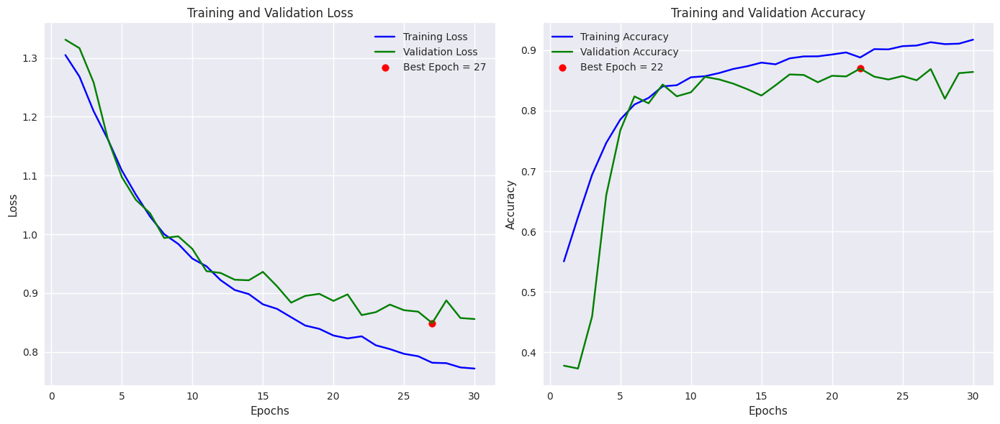

In [36]:
# TODO: Plot training and validation losses and accuracies
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plt.plot(range(1, len(train_losses) + 1), train_losses, 'b-', label='Training loss')
plt.plot(range(1, len(val_losses) + 1), val_losses, 'g-', label='Validation loss')
best_epoch_loss = val_losses.index(min(val_losses)) + 1
best_val_loss = min(val_losses)
plt.scatter(best_epoch_loss, best_val_loss, c='red', label=f'best epoch= {best_epoch_loss}')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(range(1, len(train_accuracies) + 1), train_accuracies, 'b-', label='Training Accuracy')
plt.plot(range(1, len(val_accuracies) + 1), val_accuracies, 'g-', label='Validation Accuracy')
best_epoch_acc = val_accuracies.index(max(val_accuracies)) + 1
best_val_acc = max(val_accuracies)
plt.scatter(best_epoch_acc, best_val_acc, c='red', label=f'best epoch= {best_epoch_acc}')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

## Plottings

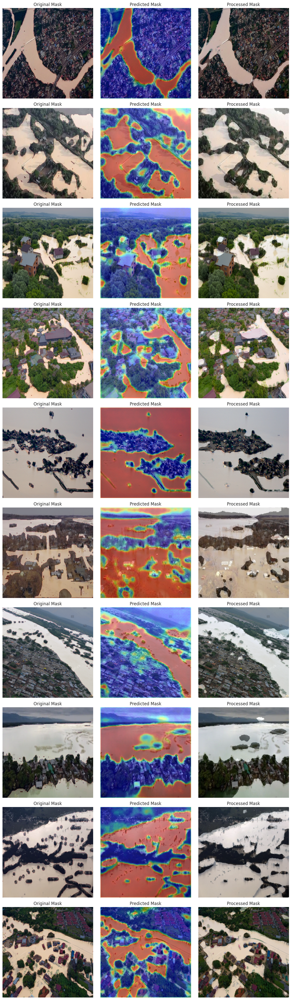

In [47]:
# Plot the original mask, the one you predicted, and the final one using a threshold
def visualize_masks(dataset, model, device, num_samples, threshold=0.5):
    fig, ax = plt.subplots(num_samples, 3, figsize=(12, num_samples * 4))
    ax = ax.ravel()
    for idx in range(num_samples):
        image = dataset[idx][0].to(device)
        true_mask = dataset[idx][1].to(device)
        sample_img = image.permute(1, 2, 0).detach().numpy()
        true_mask = true_mask.squeeze().detach().numpy()
        input_tensor = image.unsqueeze(0)
        pred_mask = model(input_tensor).squeeze().detach().numpy()
        binary_mask = (pred_mask >= threshold).astype(np.uint8)
        ax[3 * idx].imshow(sample_img)
        ax[3 * idx].imshow(true_mask, alpha=0.4)
        ax[3 * idx].set_title("Original Mask")
        ax[3 * idx].axis('off')
        ax[3 * idx + 1].imshow(sample_img)
        ax[3 * idx + 1].imshow(pred_mask, alpha=0.4, cmap='jet')
        ax[3 * idx + 1].set_title("Predicted Mask")
        ax[3 * idx + 1].axis('off')
        ax[3 * idx + 2].imshow(sample_img)
        ax[3 * idx + 2].imshow(binary_mask, alpha=0.4, cmap='gray')
        ax[3 * idx + 2].set_title("Processed Mask")
        ax[3 * idx + 2].axis('off')
    plt.tight_layout()
    plt.show()

visualize_masks(dataset=val_dataset, model=unet_model, device='cuda', num_samples=10)

1. **Comparison with Conventional Loss Functions**:
    - How do Dice and Jaccard Losses differ from Cross-Entropy or Mean Squared Error, particularly in terms of sensitivity to class imbalances?

    Dice and Jaccard Losses: Designed for tasks like segmentation, they directly optimize spatial overlap, inherently focusing on class-specific performance. This makes them more robust to class imbalances, as they give equal importance to all regions, regardless of their size.
    
    Cross-Entropy and MSE: These losses treat each pixel/element equally, leading to bias in favor of dominant classes in imbalanced datasets, often underperforming for rare or small classes.

    - What advantages do these losses offer in capturing the spatial overlap between the predicted and true segmentations?

    Dice and Jaccard Losses: Measure the similarity between predicted and true masks using overlap metrics (intersection over union), directly encouraging high spatial accuracy and better segmentation boundaries.
    
    Cross-Entropy and MSE: Focus on pixel-wise differences or probabilities, which may not effectively capture spatial relationships or boundary quality.


2. **Interpretation of Loss Values**:
    - Discuss what high or low loss scores reveal about the state and effectiveness of your segmentation model.

    High Loss Scores:Indicate poor segmentation, where predictions deviate significantly from the ground truth. This may result from model underfitting, improper initialization, or inadequate feature learning.
    
    Low Loss Scores:Suggest effective segmentation with good alignment between predicted and true masks. However, excessively low values might indicate overfitting, where the model memorizes the training data without generalizing well to unseen samples.

Evaluate the role of the attention mechanism in optimizing segmentation accuracy in cluttered environments. How does it refine the segmentation process?

The attention mechanism refines segmentation in cluttered environments by dynamically focusing on relevant features while suppressing noise. It improves boundary delineation and enhances the representation of critical regions, ensuring precision even in complex scenes. Attention also integrates multi-scale features, balancing fine details with global context.

What is the importance of skip connections in U-Net, and how do they enhance the accuracy of segmentation tasks?

Skip connections in U-Net connect encoder and decoder layers, preserving spatial details lost during downsampling. They enhance segmentation by transferring fine-grained features like edges and textures, ensuring accurate boundary reconstruction. These connections also improve gradient flow, facilitating the training of deep networks and enabling robust segmentation of intricate structures.

Explain the difference between the predicted and processed mask above.

Predicted Mask: Represents the model's probabilistic output, with pixel values as likelihoods for belonging to specific classes.

Processed Mask: A thresholded binary version of the predicted mask, converting probabilities into discrete class assignments for final visualization and evaluation.